In [26]:
# Import geopandas
import geopandas as gpd
# import Folium
import folium
# Import matplotlib
import matplotlib.pyplot as plt

In [11]:
# Path de nuestro shapefile
shapefile_ecobici = './DATASET/Area de influencia de Ecobici (500 mts)/buffer_ecobici.shp'
# Leemos el archivo
areaEcobici = gpd.read_file(shapefile_ecobici)
# Mostramos el contenido de las primeras 10 filas
areaEcobici.head(10)

,id,name,address,addressnum,zipcode,districtna,location_l,location_1,BUFF_DIST,geometry
0,426.0,426 CERRADA DE POPOCATEPETL-AV. POPOCATEPETL (EJE,426 - Cerrada De Popocatepetl-Av. Popocatepetl...,S/N,3330,Xoco,19.365519,-99.166017,150.0,"POLYGON ((482565.216 2141430.501, 482576.040 2..."
1,330.0,330 CALLE 15-AVENIDA PATRIOTISMO,330 - Calle 15-Avenida Patriotismo,S/N,3800,San Pedro de los Pinos,19.389358,-99.182606,150.0,"POLYGON ((480825.856 2144070.110, 480836.680 2..."
2,401.0,401 SAN LORENZO-AVENIDA CUAUHTEMOC,401 - San Lorenzo-Avenida Cuauhtemoc,S/N,3310,Santa Cruz Atoyac,19.372147,-99.161580,150.0,"POLYGON ((483031.868 2142163.464, 483042.692 2..."
3,370.0,370 TLACOQUEMECATL-AV. INSURGENTES,370 - Tlacoquemecatl-Av. Insurgentes,S/N,3200,Tlacoquemecatl,19.378818,-99.177054,150.0,"POLYGON ((481407.637 2142903.222, 481418.461 2..."
4,328.0,328 AVENIDA 1-CALLE 7,328 - Avenida 1-Calle 7,S/N,3800,San Pedro de los Pinos,19.392586,-99.184742,150.0,"POLYGON ((480601.952 2144427.536, 480612.776 2..."
5,8.0,8 REFORMA-GENERAL PRIM,008 - Reforma - General Prim,S/N,06500,Tabacalera,19.431141,-99.158317,150.0,"POLYGON ((483380.521 2148691.008, 483391.344 2..."
6,189.0,189 GDOR RAFAEL REBOLLAR-GDOR JOSÃâ° CEBALLOS,189 - Gobernador Rafael Rebollar-Gobernador Jo...,S/N,None,San Miguel Chapultepec,19.410040,-99.187980,150.0,"POLYGON ((480264.064 2146359.243, 480274.887 2..."
7,183.0,183 GABINO BARRERA-GUILLERMO PRIETO,183 - Gabino Barrera-Guillermo Prieto,S/N,None,San Rafael,19.437670,-99.164020,150.0,"POLYGON ((482782.530 2149414.024, 482793.353 2..."
8,263.0,263 SADI CARNOT-GÃâMEZ FARIAS,263 - Sadi Carnot - GÃÂ³mez Farias,S/N,None,San Rafael,19.436274,-99.158425,150.0,"POLYGON ((483369.706 2149259.002, 483380.530 2..."
9,254.0,254 ALFONSO HERRERA-MIGUEL SHULTZ,254 - Alfonso Herrera-Miguel Shultz,S/N,None,San Rafael,19.439350,-99.160070,150.0,"POLYGON ((483197.342 2149599.532, 483208.166 2..."


In [12]:
shapefile_ejes = './DATASET/Principales Ejes viales/ejes_viales.shp'
# Read in the services district shapefile and look at the first few rows.
ejes_viales = gpd.read_file(shapefile_ejes)
print(ejes_viales.head())

             Name                                         descriptio  \
0     EJE 1 NORTE  DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...   
1   EJE 1 ORIENTE  DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...   
2  EJE 1 PONIENTE  DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...   
3       EJE 1 SUR  DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...   
4     EJE 1-A SUR  DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...   

     tipo_vial                               entre id_vial  \
0  EJES VIALES      CIRCUITO INTERIOR Y PERIFERICO       1   
1  EJES VIALES          PERIFERICO Y EJE 2 ORIENTE       2   
2  EJES VIALES      PERIFERICO Y CIRCUITO INTERIOR       3   
3  EJES VIALES   CIRCUITO INTERIOR Y EJE 1 ORIENTE       4   
4  EJES VIALES  EJE 1 PONIENTE Y CIRCUITO INTERIOR       5   

                                            geometry  
0  LINESTRING Z (482714.673 2150424.403 0.000, 48...  
1  MULTILINESTRING Z ((485585.145 2138927.041 0.0...  
2  MULTILINESTRING Z ((482143

In [13]:
import re

def getEjeName(columnName: str):
    result = re.findall(r"\d+", columnName)
    ejeNumber = 0
    if len(result) > 0:
        ejeNumber = int(result[0])

    match ejeNumber:
        case 1:
            return "EJE 1"
        case 2:
            return "EJE 2"
        case 3:
            return "EJE 3"
        case 4:
            return "EJE 4"
        case 5:
            return "EJE 5"
        case 6:
            return "EJE 6"
        case 7:
            return "EJE 7"
        case 8:
            return "EJE 8"
        case 9:
            return "EJE 9"
        case 10:
            return "EJE 10"
        case _:
            return "EJE CENTRAL"

In [14]:
ejes_viales['Eje']  = ejes_viales.apply(lambda x: getEjeName(x.Name), axis=1)
ejes_viales.head(10)

,Name,descriptio,tipo_vial,entre,id_vial,geometry,Eje
0,EJE 1 NORTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,CIRCUITO INTERIOR Y PERIFERICO,1,"LINESTRING Z (482714.673 2150424.403 0.000, 48...",EJE 1
1,EJE 1 ORIENTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,PERIFERICO Y EJE 2 ORIENTE,2,MULTILINESTRING Z ((485585.145 2138927.041 0.0...,EJE 1
2,EJE 1 PONIENTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,PERIFERICO Y CIRCUITO INTERIOR,3,MULTILINESTRING Z ((482143.829 2159490.081 0.0...,EJE 1
3,EJE 1 SUR,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,CIRCUITO INTERIOR Y EJE 1 ORIENTE,4,"LINESTRING Z (486811.111 2147922.616 0.000, 48...",EJE 1
4,EJE 1-A SUR,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,EJE 1 PONIENTE Y CIRCUITO INTERIOR,5,"LINESTRING Z (483866.670 2147957.757 0.000, 48...",EJE 1
5,EJE 10 SUR,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,AUTOPISTA MEXICO-PUEBLA Y MAR FRIO,6,"LINESTRING Z (499089.314 2133466.661 0.000, 49...",EJE 10
6,EJE 10 SUR,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,PERIFERICO Y PACIFICO,7,MULTILINESTRING Z ((477909.035 2137501.802 0.0...,EJE 10
7,EJE 2 NORTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,OCEANIA Y CUITLAHUAC,8,"LINESTRING Z (490551.217 2149925.643 0.000, 48...",EJE 2
8,EJE 2 ORIENTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,EJE 1 ORIENTE Y PERIFERICO,9,"LINESTRING Z (486557.257 2132300.684 0.000, 48...",EJE 2
9,EJE 2 PONIENTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,UNIVERSIDAD Y CIRCUITO INTERIOR,10,MULTILINESTRING Z ((483218.970 2145266.596 0.0...,EJE 2


In [16]:
# Filtramos nuestro Eje
eje4 = ejes_viales[ejes_viales['Eje'] == "EJE 4"]
eje4

,Name,descriptio,tipo_vial,entre,id_vial,geometry,Eje
17,EJE 4 NORTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,AQUILES SERDAN Y EJE 5 NORTE,18,"LINESTRING Z (479122.350 2155696.774 0.000, 47...",EJE 4
18,EJE 4 NORTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,16 DE SEPTIEMBRE Y REFINERIA AZCAPOTZALCO,19,"LINESTRING Z (480975.602 2154999.038 0.000, 48...",EJE 4
19,EJE 4 ORIENTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,CIRCUITO INTERIOR Y CALLE 7,20,MULTILINESTRING Z ((491819.841 2145940.962 0.0...,EJE 4
20,EJE 4 PONIENTE,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,MOLINOS Y AV. SANJERONIMO,21,"LINESTRING Z (480247.889 2142061.539 0.000, 48...",EJE 4
21,EJE 4 SUR,DescripciÃ³n: <br>tipo_vial: EJES VIALES<br>vi...,EJES VIALES,CIRCUITO INTERIOR Y PERIFÃ‰RICO,22,"LINESTRING Z (480668.637 2145958.730 0.000, 48...",EJE 4


In [18]:
m = areaEcobici.explore(
    tiles="CartoDB dark_matter",
    column="districtna",
    legend=True,
    legend_kwds=dict(colorbar=False), # do not use colorbar
    name="ecobicis" # name of the layer in the map
)

eje4.explore(
    m=m,
    tiles="CartoDB dark_matter",
    column="Name",
    popup=True,
    tooltip="Name",
    name="ejes" # name of the layer in the map
)


# folium.TileLayer('CDMX', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

In [19]:
# Cargamos la info del Metro
shapefile_path = 'DATASET/Area de influencia del Sistema de Transporte Colectivo, Metro (800 mts)/buffer_metro.shp'
# Leemos el archivo
areaMetro = gpd.read_file(shapefile_path)
# lo pasamos a EPSG:4326
areaMetro = areaMetro.to_crs(epsg=4326)
# Mostramos el contenido de las primeras 10 filas
areaMetro.head(10)

,Name,stop_id,stop_name,stop_desc,stop_lat,stop_lon,trip_heads,agency_id,BUFF_DIST,geometry
0,Valentin Campa,1.0,None,None,0.000000,0.000000,None,None,800.0,"POLYGON ((-99.19994 19.38967, -99.19970 19.389..."
1,Alvaro Obregon,2.0,None,None,0.000000,0.000000,None,None,800.0,"POLYGON ((-99.19573 19.39731, -99.19549 19.397..."
2,None,3.0,San Cosme,Metro 2,19.441858,-99.160945,Cuatro Caminos - TasqueÃ±a,METRO,800.0,"POLYGON ((-99.16095 19.44908, -99.16070 19.449..."
3,None,4.0,Portales,Metro 2,19.369768,-99.141301,Cuatro Caminos - TasqueÃ±a,METRO,800.0,"POLYGON ((-99.14130 19.37699, -99.14106 19.376..."
4,None,5.0,Nopalera,Metro 12,19.299398,-99.046211,TlÃ¡huac - Mixcoac,METRO,800.0,"POLYGON ((-99.04621 19.30662, -99.04597 19.306..."
5,None,6.0,Puebla,Metro 9,19.406970,-99.082335,Tacubaya - PantitlÃ¡n,METRO,800.0,"POLYGON ((-99.08234 19.41420, -99.08209 19.414..."
6,None,7.0,Santa Marta,Metro A,19.359804,-98.995894,La Paz - PantitlÃ¡n,METRO,800.0,"POLYGON ((-98.99589 19.36703, -98.99565 19.367..."
7,None,8.0,MartÃ­Â­n Carrera_1_2,Metro LÃ­Â­nea 6 correspondencia con lÃ­Â­nea 4.,19.482311,-99.105542,MartÃ­Â­n Carrera - El Rosario,METRO,800.0,"POLYGON ((-99.10554 19.48954, -99.10530 19.489..."
8,None,9.0,Santa Anita_1,Metro LÃ­Â­nea 4 correspondencia con lÃ­Â­neas 8.,19.404258,-99.121206,MartÃ­Â­n Carrera - Santa Anita,METRO,800.0,"POLYGON ((-99.12121 19.41149, -99.12097 19.411..."
9,None,10.0,Bellas Artes_1_2,Metro LÃ­Â­nea 2 correspondencia con lÃ­Â­nea 8.,19.435960,-99.141558,Cuatro Caminos - TasqueÃ±a,METRO,800.0,"POLYGON ((-99.14156 19.44319, -99.14132 19.443..."


In [40]:
# Filtramos la linea de metro
metroMixcoacTlahuac = areaMetro[areaMetro['trip_heads'].str.contains('Barranca del Muerto', na=False) | areaMetro['trip_heads'].str.contains('Mixcoac', na=False)]
# Vemos que se haya filtrado
metroMixcoacTlahuac.head()

,Name,stop_id,stop_name,stop_desc,stop_lat,stop_lon,trip_heads,agency_id,BUFF_DIST,geometry
4,None,5.0,Nopalera,Metro 12,19.299398,-99.046211,TlÃ¡huac - Mixcoac,METRO,800.0,"POLYGON ((-99.04621 19.30662, -99.04597 19.306..."
26,None,27.0,Calle 11,Metro 12,19.320256,-99.084867,TlÃ¡huac - Mixcoac,METRO,800.0,"POLYGON ((-99.08487 19.32748, -99.08463 19.327..."
28,None,29.0,Atlalilco_1,Metro LÃ­Â­nea 12 correspondencia con lÃ­Â­nea 8.,19.352641,-99.106325,TlÃ¡huac - Mixcoac,METRO,800.0,"POLYGON ((-99.10632 19.35987, -99.10608 19.359..."
30,None,31.0,Auditorio,Metro 7,19.425305,-99.191737,Barranca del Muerto - El Rosario,METRO,800.0,"POLYGON ((-99.19174 19.43253, -99.19150 19.432..."
33,None,34.0,Eje Central_1_3,Metro 12,19.361185,-99.151332,TlÃ¡huac - Mixcoac,METRO,800.0,"POLYGON ((-99.15133 19.36841, -99.15109 19.368..."


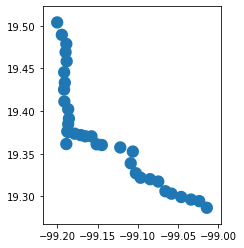

In [41]:
metroMixcoacTlahuac.plot()
plt.show()

In [42]:
m2 = metroMixcoacTlahuac.explore(
    column="stop_name",
    tooltip="stop_name", # show "BoroName" value in tooltip (on hover)
    popup=True, # show all values in popup (on click)
    tiles="CartoDB dark_matter", # use "CartoDB positron" tiles matplotlib colormap
)

# Agregamos los puntos para que sea mas visible
for _, r in metroMixcoacTlahuac.iterrows():
    lat = r['stop_lat']
    lon = r['stop_lon']
    folium.Marker(location=[lat, lon],
                  popup='Metro: {}'.format(r['stop_name'])).add_to(m2)

In [44]:
ejes_viales.explore(
    m=m2,
    tiles="CartoDB dark_matter",
    column="Name",
    popup=True,
    tooltip="Name",
    name="ejes" # name of the layer in the map
)

folium.LayerControl().add_to(m2)

m2

In [46]:
# Traemos la info de las rutas del transporte publico
shapefile_path = 'DATASET/rutas_y_corredores_del_transporte_publico_concesionado/rutas_y_corredores_del_transporte_publico_concesionado.shp'
# Leemos el archivo
areaTransporte = gpd.read_file(shapefile_path)
areaTransporte = areaTransporte.to_crs(epsg=4326)
# Mostramos el contenido de las primeras 10 filas
areaTransporte.head(10)

,id,tipo_trans,ruta_corre,detalle,detalle_2,descrip,geometry
0,782.0,RUTAS DE TRANSPORTE,RUTA 1,001 TAXQUE?A - ZAPATA,None,RUTA 1 001 TAXQUE?A - ZAPATA,"LINESTRING (-99.13822 19.34397, -99.13752 19.3..."
1,784.0,RUTAS DE TRANSPORTE,RUTA 1,001 TLALNEPANTLA - CENTRAL DEL NORTE OD,None,RUTA 1 001 TLALNEPANTLA - CENTRAL DEL NORTE,"LINESTRING (-99.15904 19.52629, -99.15899 19.5..."
2,786.0,RUTAS DE TRANSPORTE,RUTA 1,R-1,Uam - Canal de Tezontle,RUTA 1 001 UAM - CANAL DE TEZONTLE,"LINESTRING (-99.07527 19.35133, -99.07537 19.3..."
3,791.0,RUTAS DE TRANSPORTE,RUTA 1,R-1,001 VILLACOAPA - OFICINAS PEMEX,RUTA 1 001 VILLACOAPA - OFICINAS PEMEX (#2),"LINESTRING (-99.17279 19.43764, -99.17285 19.4..."
4,794.0,RUTAS DE TRANSPORTE,RUTA 1,R--01,001 ZAPATA - RENOVACION OD,RUTA 1 001 ZAPATA - RENOVACION,"LINESTRING (-99.16491 19.37082, -99.16788 19.3..."
5,796.0,RUTAS DE TRANSPORTE,RUTA 1,R-001,R001 ZAPATA - RENOVACION OD,RUTA 1 001 ZAPATA - VICENTE GUERRERO,"LINESTRING (-99.16374 19.37061, -99.16484 19.3..."
6,797.0,RUTAS DE TRANSPORTE,RUTA 1,R-001,VICENTE GUERRERO - ZAPATA,RUTA 1 001 ZAPATA - VICENTE GUERRERO,"LINESTRING (-99.06685 19.36398, -99.06679 19.3..."
7,800.0,RUTAS DE TRANSPORTE,RUTA 1,R-1,001 TORRES / EJIDOS / SAN FERNANDO - METRO CU,RUTA 1 METRO CU - TORRES / EJIDOS / SAN FERNANDO,"LINESTRING (-99.12814 19.28640, -99.12789 19.2..."
8,804.0,RUTAS DE TRANSPORTE,RUTA 1,R-1,R-1 - VILLA PANAMERICANA - METRO CU,RUTA 1 R-1 METRO CU - VILLA PANAMERICAN,"LINESTRING (-99.18013 19.30376, -99.17998 19.3..."
9,808.0,RUTAS DE TRANSPORTE,RUTA 1,METRO C. U. -SAN pEDRO MARTIN,PARTIENDO DE SU BASE INICIAL CONTIN?A PROLONGA...,RUTA 1 R-1 METRO C.U. - SAN PEDRO MARTIR,"LINESTRING (-99.17288 19.32334, -99.17332 19.3..."


In [49]:
m3 = areaTransporte.explore(
    column="ruta_corre",
    tooltip="descrip", # show "BoroName" value in tooltip (on hover)
    popup=True, # show all values in popup (on click)
    tiles="CartoDB dark_matter", # use "CartoDB positron" tiles matplotlib colormap
)

eje4.explore(
    m=m3,
    tiles="CartoDB dark_matter",
    column="Name",
    color="red",
    popup=True,
    tooltip="Name",
    name="ejes" # name of the layer in the map
)


# folium.TileLayer('CDMX', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m3)  # use folium to add layer control

m3

In [50]:
m3.save("D:\\Workspace\\ws_python\\semovi\\general\\rutas_eje4.html")